In [1]:
import numpy as np
import torch
import cv2
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import matplotlib.pyplot as plt
import pandas as pd
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw

test = pd.read_csv("test_data.csv")

sam2_checkpoint = "checkpoints/sam2_hiera_small.pt"
model_path = "model.torch"
num_samples = 30  

def read_image(image_path): 
    img = cv2.imread(image_path)[..., ::-1]  
    mask = np.ones(img.shape)

    r = np.min([1024 / img.shape[1], 1024 / img.shape[0]])
    img = cv2.resize(img, (int(img.shape[1] * r), int(img.shape[0] * r)))
    mask = cv2.resize(mask, (int(mask.shape[1] * r), int(mask.shape[0] * r)), interpolation=cv2.INTER_NEAREST)
    
    return img, mask



In [2]:
def get_points(mask, num_points): 
    points = []
    coords = np.argwhere(mask > 0)
    for i in range(num_points):
        yx = np.array(coords[np.random.randint(len(coords))])
        points.append([[yx[1], yx[0]]])
    return np.array(points)


In [3]:
def draw_bounding_boxes(image_path, annotation_path):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    tree = ET.parse(annotation_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        class_label = obj.find('damage').text
        
        if class_label in ['HD', 'LD']:  
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            
            draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
    
    return image


In [4]:

model_cfg = "sam2_hiera_s.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device="cuda")
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

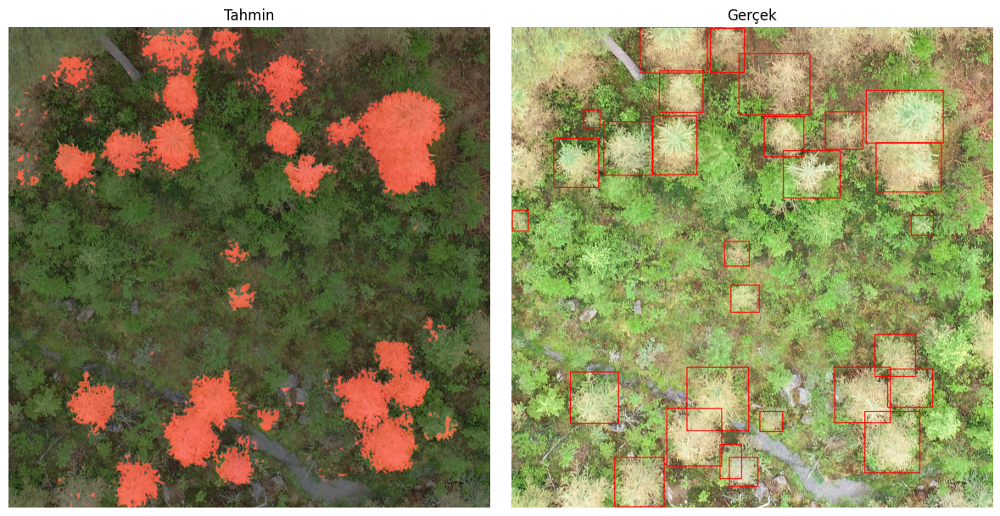

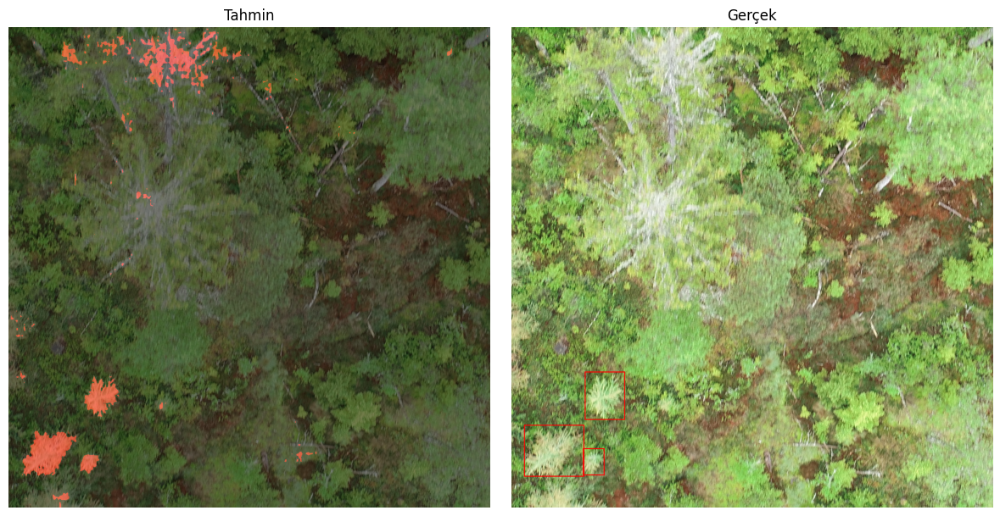

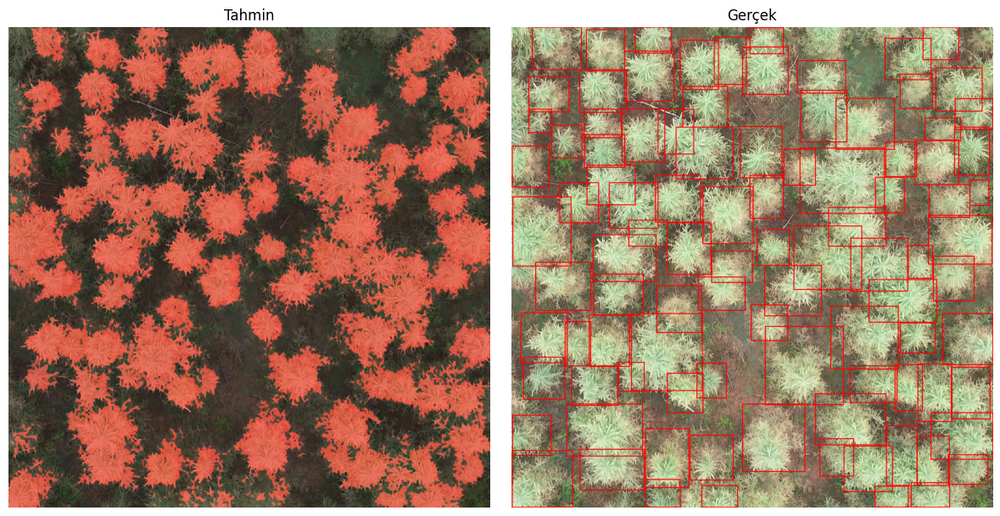

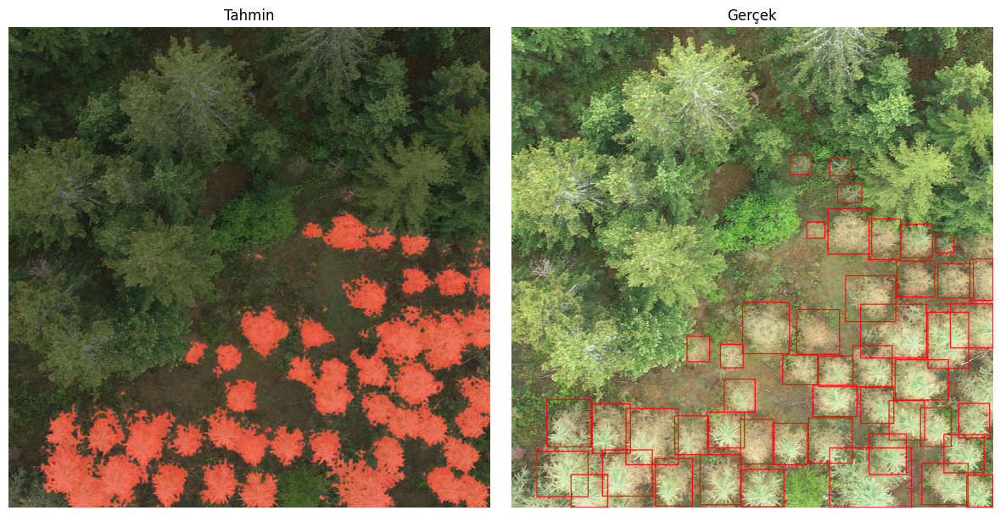

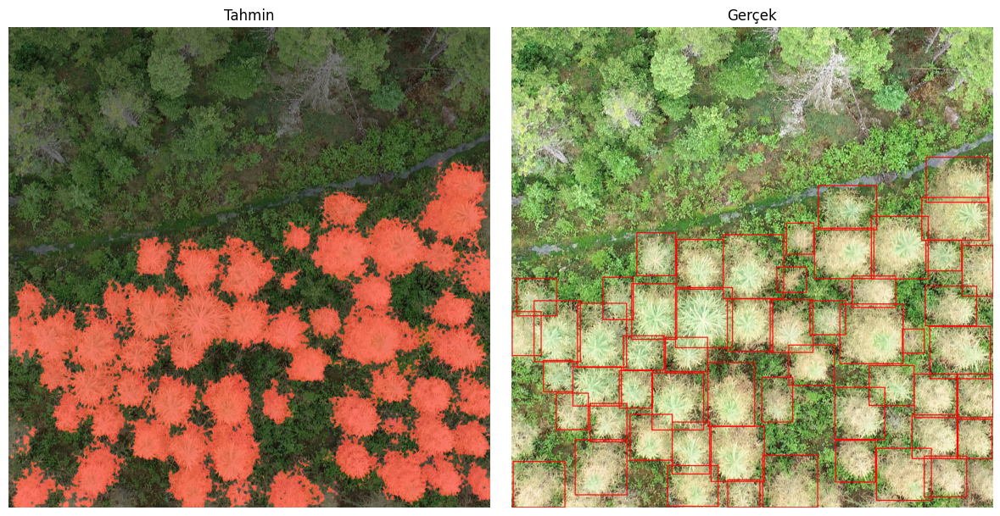

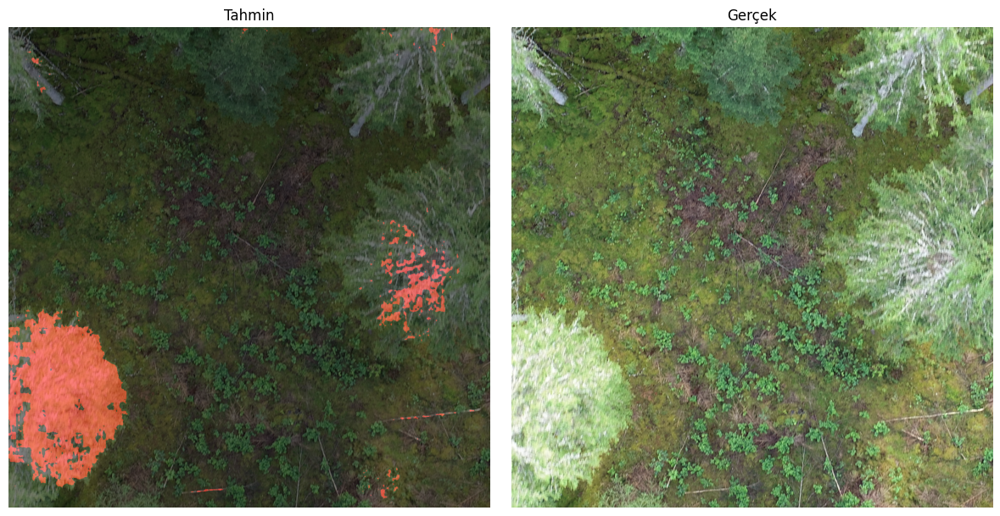

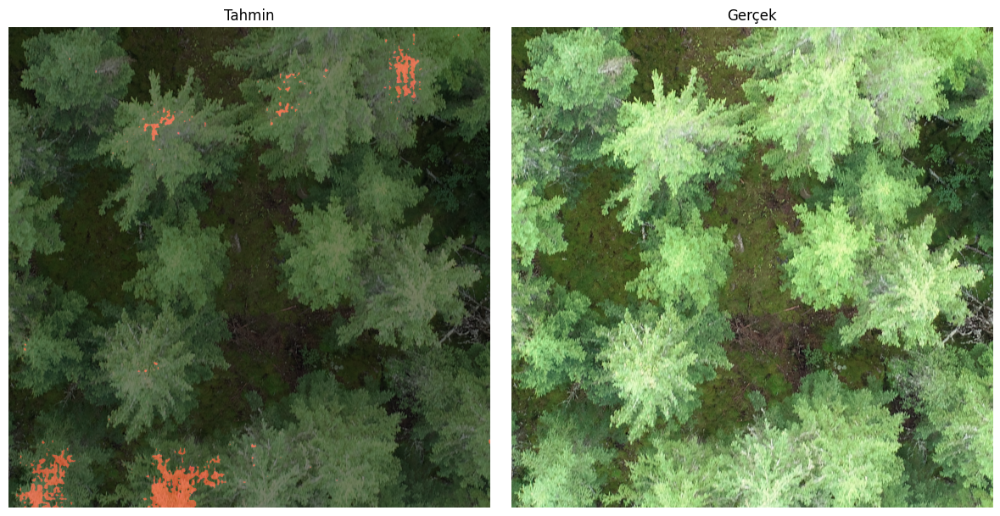

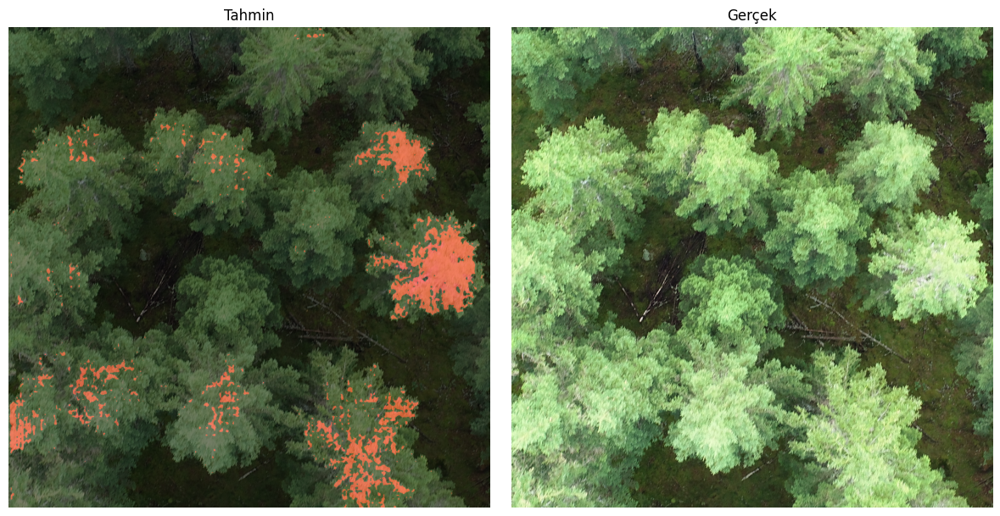

In [6]:
import os

output_dir = "output_images"
os.makedirs(output_dir, exist_ok=True)

predictor.model.load_state_dict(torch.load(model_path))

for j in range(8):
    image_path = test.iloc[j]["image"]
    annotation_path = test.iloc[j]["annotation"]
    
    image, mask = read_image(image_path)
    input_points = get_points(mask, num_samples)

    with torch.inference_mode():
        predictor.set_image(image)
        masks, scores, logits = predictor.predict(
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0], 1])
        )

    masks = masks[:, 0].astype(bool)
    sorted_masks = masks[np.argsort(scores[:, 0])][::-1].astype(bool)

    seg_map = np.zeros_like(sorted_masks[0], dtype=np.uint8)
    occupancy_mask = np.zeros_like(sorted_masks[0], dtype=bool)

    for i in range(sorted_masks.shape[0]):
        mask = sorted_masks[i]
        
        if mask.sum() == 0:
            continue
        
        if (mask * occupancy_mask).sum() / mask.sum() > 0.15:
            continue
        
        mask[occupancy_mask] = 0
        seg_map[mask] = i + 1
        occupancy_mask[mask] = 1

    rgb_image = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    for id_class in range(1, seg_map.max() + 1):
        rgb_image[seg_map == id_class] = [255, 0, 0]
    
    mix_image = ((rgb_image / 2 + image / 2).astype(np.uint8))
    bounded_image = draw_bounding_boxes(image_path, annotation_path)

    mix_image_name = os.path.join(output_dir, f"tahmin{j}.png")
    bounded_image_name = os.path.join(output_dir, f"gerçek{j}.png")

    plt.imsave(mix_image_name, mix_image)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(mix_image)
    plt.title("Tahmin")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(bounded_image)
    plt.title("Gerçek")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
